# Técnicas de Normalización para Imágenes Biomédicas

Este notebook implementa y analiza diferentes técnicas de normalización para las imágenes de núcleos celulares:

1. **Normalización estadística**: Media 0, desviación estándar 1
2. **Normalización por canal**: Tratamiento independiente de canales RGB
3. **Técnicas específicas para imágenes biomédicas**:
   - Ecualización de histograma
   - Ecualización adaptativa (CLAHE)
   - Corrección gamma
   - Normalización de Macenko (para tinción H&E)

El objetivo es comparar estas técnicas y determinar cuál es más efectiva para nuestro dataset de núcleos celulares.

In [1]:
# Importación de librerías necesarias
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, exposure, color, util
import cv2
from tqdm.notebook import tqdm
from scipy import linalg

# Configuración de visualización
%matplotlib inline
plt.rcParams['figure.figsize'] = (16, 10)

# Añadir directorio raíz al path para importar módulos propios si es necesario
sys.path.append('..')

## 1. Carga de Datos

Cargaremos algunas imágenes representativas del dataset para probar las diferentes técnicas de normalización.

In [6]:
# Definir la función para cargar imágenes
def load_samples(sample_ids, data_dir='../data'):
    """
    Carga imágenes y máscaras de los IDs especificados.
    
    Args:
        sample_ids: Lista de IDs de muestras a cargar
        data_dir: Directorio raíz de datos
        
    Returns:
        Lista de tuplas (ID, imagen, máscara)
    """
    samples = []
    
    for sample_id in sample_ids:
        # Construir rutas
        id_str = str(sample_id).zfill(5)  # Rellenar con ceros para tener formato 5 dígitos
        img_path = os.path.join(data_dir, id_str, 'image.png')
        mask_path = os.path.join(data_dir, id_str, 'mask.png')
        
        # Verificar si las rutas existen
        if not os.path.exists(img_path) or not os.path.exists(mask_path):
            print(f"La imagen o máscara para ID {sample_id} no existe")
            continue
        
        # Cargar imagen y máscara
        image = io.imread(img_path)
        mask = io.imread(mask_path)
        
        samples.append((sample_id, image, mask))
    
    print(f"Se cargaron {len(samples)} muestras")
    return samples

# Seleccionar algunas muestras con diferentes características
# Elegimos muestras con diferentes iluminaciones y contrastes
sample_ids = [1, 2, 3, 10, 4, 20, 50, 100]  # Puedes ajustar estos IDs según las imágenes interesantes
samples = load_samples(sample_ids)

Se cargaron 8 muestras


## 2. Visualización de Imágenes Originales

Veamos las imágenes originales para entender la variabilidad en iluminación, contraste y tinción.

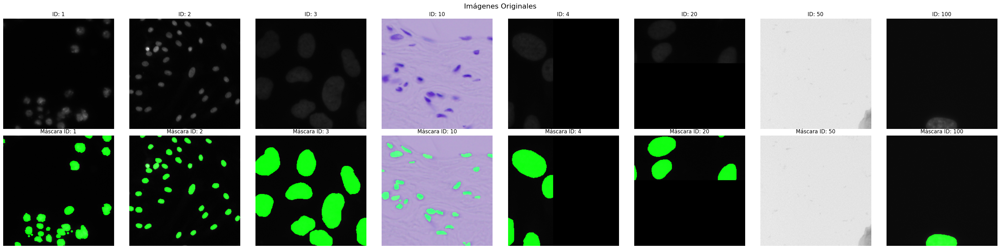

In [7]:
def visualize_samples(samples, title="Imágenes Originales"):
    """
    Visualiza las imágenes y sus máscaras en una cuadrícula.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
        title: Título para la figura
    """
    n_samples = len(samples)
    fig, axes = plt.subplots(2, n_samples, figsize=(n_samples*4, 8))
    
    for i, (sample_id, image, mask) in enumerate(samples):
        # Mostrar imagen original
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"ID: {sample_id}")
        axes[0, i].axis('off')
        
        # Mostrar máscara superpuesta
        # Normalizar máscara a valores binarios 0 y 1
        mask_binary = mask.copy()
        if mask_binary.max() > 1:
            mask_binary = mask_binary / 255
            
        # Crear overlay con la máscara
        overlay = image.copy()
        # Añadir transparencia verde a la máscara
        for c in range(3):
            channel = overlay[:,:,c]
            if c == 1:  # Canal verde
                channel[mask_binary > 0] = 255  # Verde más brillante para núcleos
            else:
                channel[mask_binary > 0] = channel[mask_binary > 0] * 0.7  # Atenuar otros canales
        
        axes[1, i].imshow(overlay)
        axes[1, i].set_title(f"Máscara ID: {sample_id}")
        axes[1, i].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualizar las imágenes originales
visualize_samples(samples)

## 3. Análisis de Histogramas

Para entender mejor la variabilidad en las imágenes, analizaremos sus histogramas de intensidad.

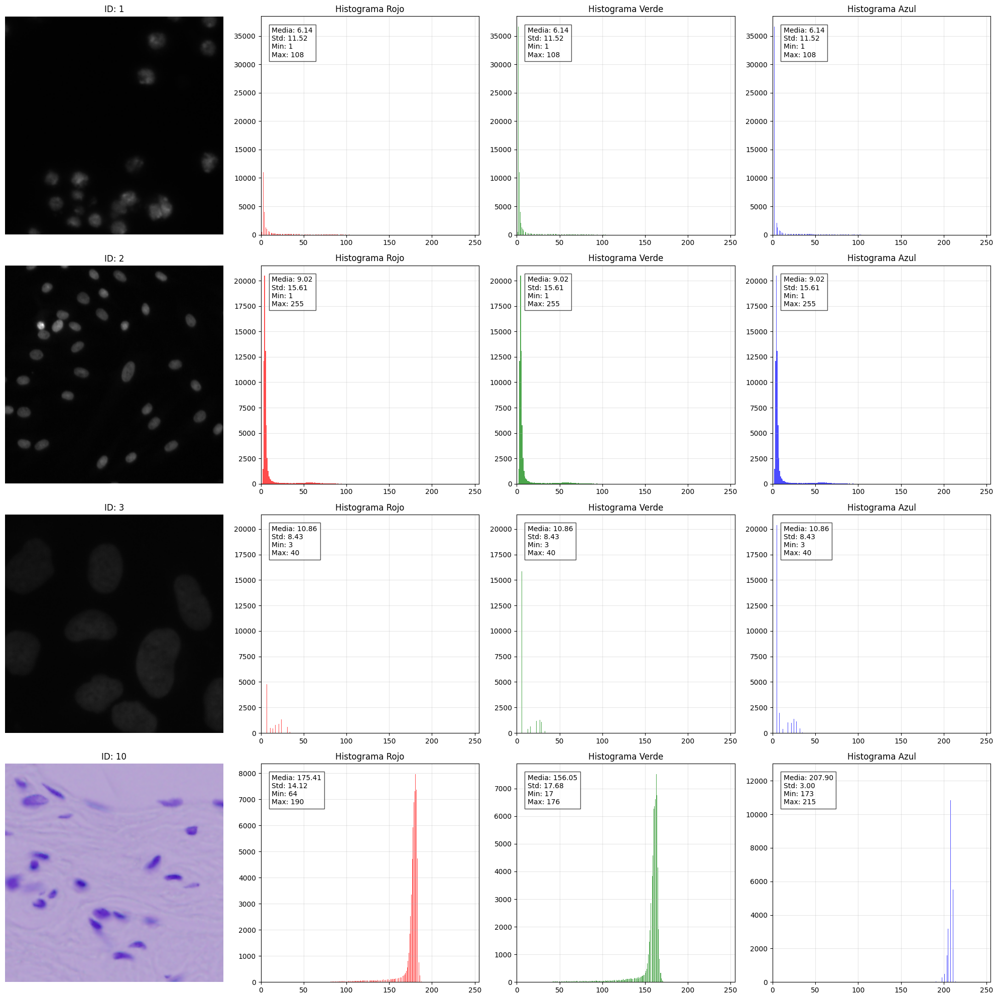

In [8]:
def visualize_histograms(samples, n_samples=4):
    """
    Visualiza los histogramas de intensidad para cada canal RGB.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
        n_samples: Número de muestras a visualizar
    """
    # Limitamos a las primeras n_samples para no saturar la visualización
    samples_to_show = samples[:n_samples]
    
    fig, axes = plt.subplots(n_samples, 4, figsize=(20, 5*n_samples))
    
    for i, (sample_id, image, _) in enumerate(samples_to_show):
        # Mostrar imagen
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"ID: {sample_id}")
        axes[i, 0].axis('off')
        
        # Histogramas por canal
        channels = ['Rojo', 'Verde', 'Azul']
        colors = ['r', 'g', 'b']
        
        for j, (channel, color) in enumerate(zip(channels, colors)):
            # Histograma del canal específico
            axes[i, j+1].hist(image[:,:,j].flatten(), bins=256, color=color, alpha=0.7)
            axes[i, j+1].set_title(f"Histograma {channel}")
            axes[i, j+1].set_xlim([0, 255])
            axes[i, j+1].grid(alpha=0.3)
            
            # Añadir estadísticas al gráfico
            mean_val = image[:,:,j].mean()
            std_val = image[:,:,j].std()
            min_val = image[:,:,j].min()
            max_val = image[:,:,j].max()
            
            stats_text = f"Media: {mean_val:.2f}\nStd: {std_val:.2f}\nMin: {min_val}\nMax: {max_val}"
            axes[i, j+1].text(0.05, 0.95, stats_text, transform=axes[i, j+1].transAxes, 
                             verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.7})
    
    plt.tight_layout()
    plt.show()

# Visualizar histogramas
visualize_histograms(samples)

## 4. Implementación de Técnicas de Normalización

Ahora implementaremos diferentes técnicas de normalización y visualizaremos sus resultados.

### 4.1 Normalización Estadística (Media 0, Desviación Estándar 1)

Esta técnica resta la media y divide por la desviación estándar, haciendo que la distribución de intensidades tenga media 0 y desviación estándar 1. Es útil para estandarizar los valores de entrada a una red neuronal.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16616161..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


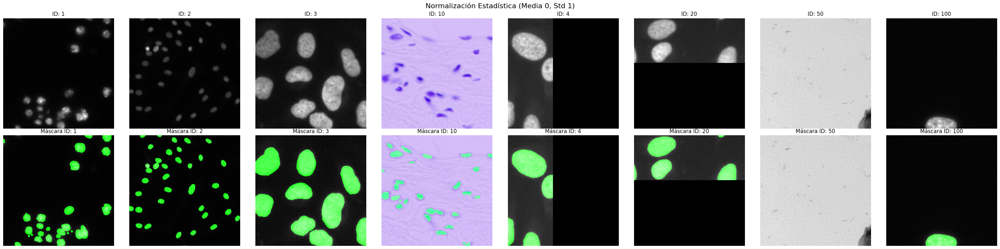

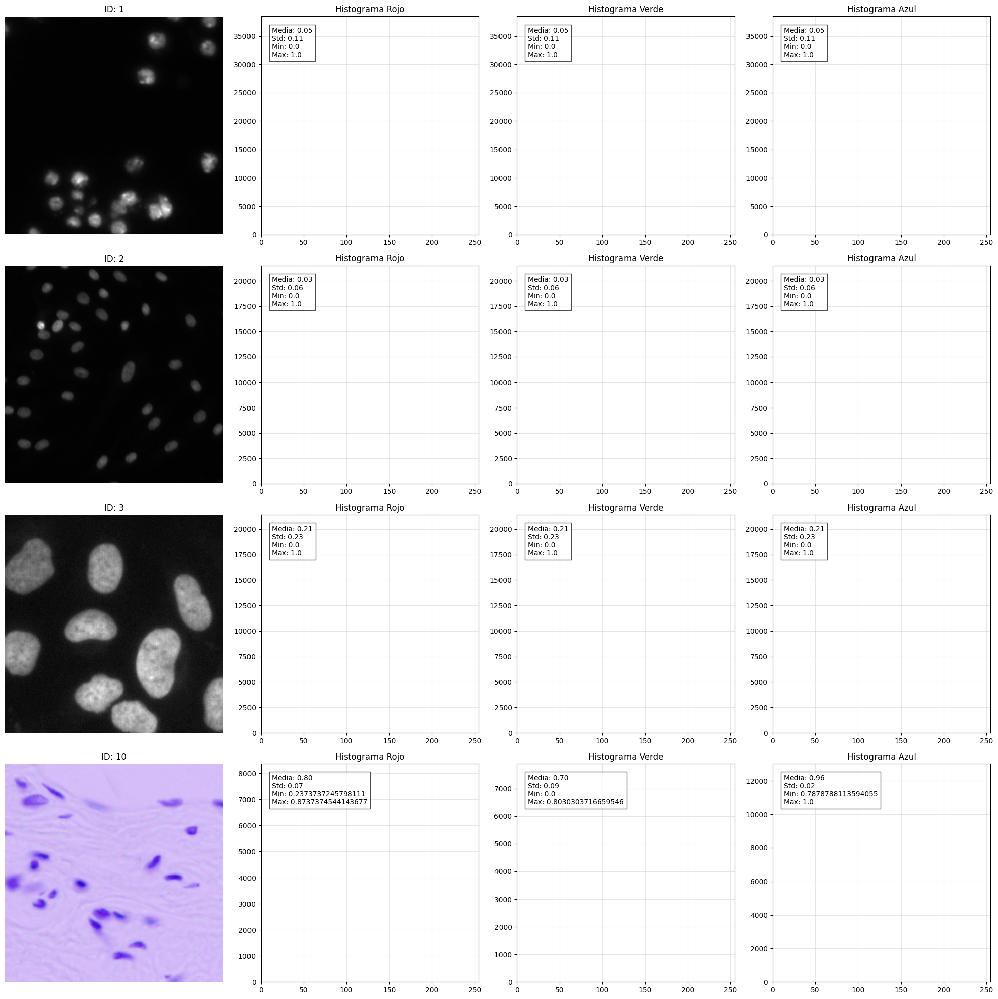

In [9]:
def normalize_statistical(image, epsilon=1e-8):
    """
    Normaliza la imagen para tener media 0 y desviación estándar 1.
    
    Args:
        image: Imagen de entrada (RGB o escala de grises)
        epsilon: Pequeño valor para evitar división por cero
        
    Returns:
        Imagen normalizada con valores flotantes
    """
    # Convertir a float para cálculos precisos
    image_float = image.astype(np.float32)
    
    # Calcular media y desviación estándar
    mean = np.mean(image_float)
    std = np.std(image_float) + epsilon  # Añadir epsilon para evitar división por cero
    
    # Normalizar: (x - μ) / σ
    normalized = (image_float - mean) / std
    
    return normalized

def visualize_normalized_statistical(samples):
    """
    Normaliza y visualiza imágenes con normalización estadística.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
    """
    normalized_samples = []
    for sample_id, image, mask in samples:
        # Normalizar estadísticamente
        norm_image = normalize_statistical(image)
        
        # Para visualización, escalamos a [0,1]
        # Encontramos min y max en la imagen normalizada
        min_val = norm_image.min()
        max_val = norm_image.max()
        
        # Escalar a [0,1] para visualización
        norm_image_viz = (norm_image - min_val) / (max_val - min_val)
        
        normalized_samples.append((sample_id, norm_image_viz, mask))
    
    # Visualizar resultados
    visualize_samples(normalized_samples, title="Normalización Estadística (Media 0, Std 1)")
    
    # También mostramos histogramas de algunas muestras normalizadas
    visualize_histograms(normalized_samples, n_samples=min(4, len(normalized_samples)))

# Normalizar y visualizar
visualize_normalized_statistical(samples)

### 4.2 Normalización por Canal

Esta técnica aplica normalización estadística a cada canal RGB por separado, lo que puede ser más efectivo cuando los canales tienen distribuciones muy diferentes entre sí.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


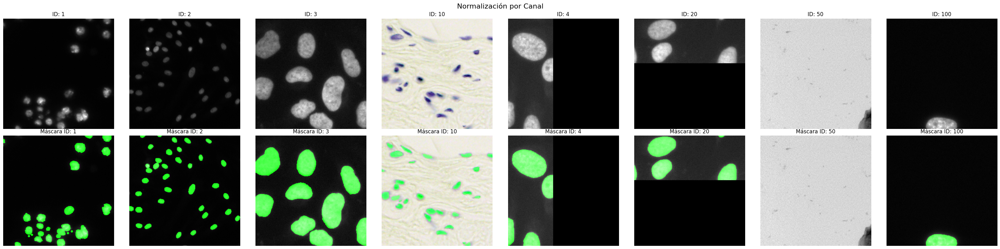

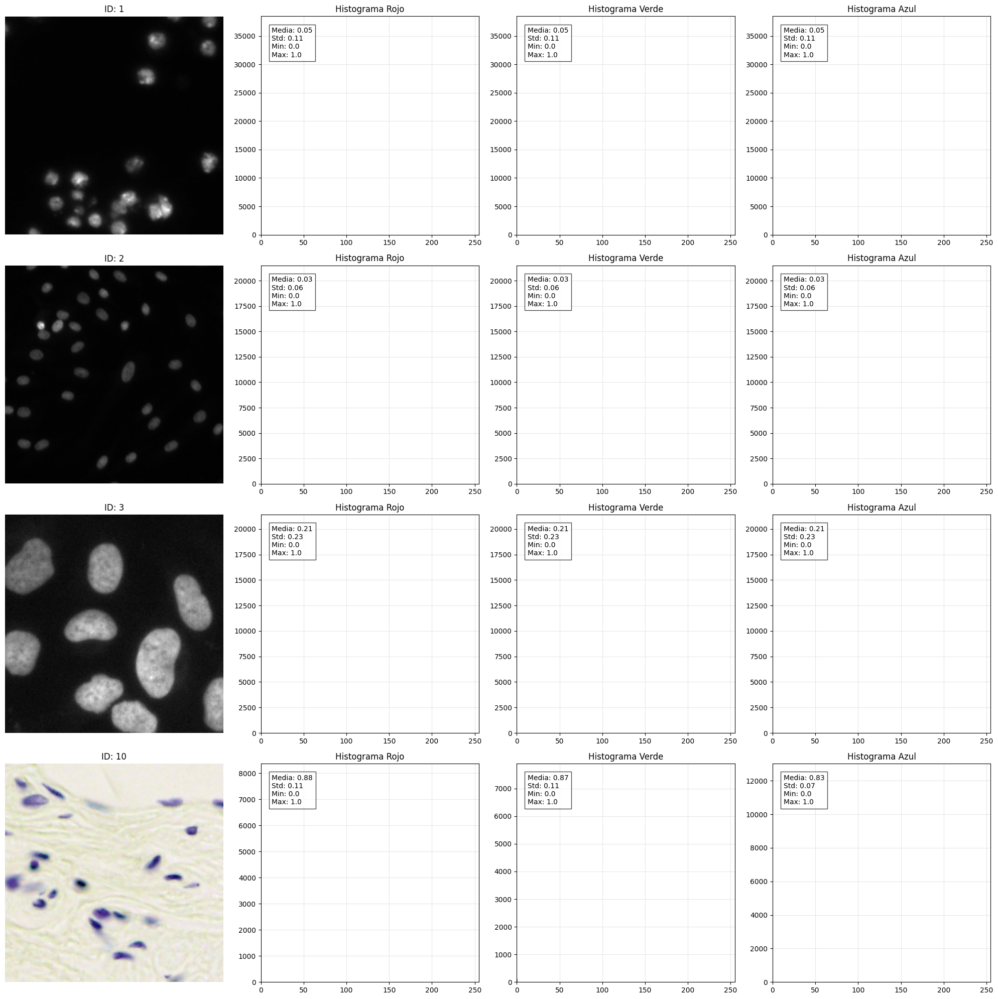

In [10]:
def normalize_per_channel(image, epsilon=1e-8):
    """
    Normaliza cada canal de la imagen por separado para tener media 0 y desviación estándar 1.
    
    Args:
        image: Imagen de entrada RGB
        epsilon: Pequeño valor para evitar división por cero
        
    Returns:
        Imagen normalizada con valores flotantes
    """
    # Verificar que la imagen es RGB
    if len(image.shape) < 3 or image.shape[2] != 3:
        raise ValueError("Esta función requiere una imagen RGB de 3 canales")
    
    # Convertir a float para cálculos precisos
    image_float = image.astype(np.float32)
    normalized = np.zeros_like(image_float)
    
    # Normalizar cada canal por separado
    for c in range(3):
        channel = image_float[:,:,c]
        mean = np.mean(channel)
        std = np.std(channel) + epsilon
        normalized[:,:,c] = (channel - mean) / std
    
    return normalized

def visualize_normalized_per_channel(samples):
    """
    Normaliza y visualiza imágenes con normalización por canal.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
    """
    normalized_samples = []
    for sample_id, image, mask in samples:
        # Normalizar por canal
        norm_image = normalize_per_channel(image)
        
        # Para visualización, escalamos a [0,1]
        # Encontramos min y max en cada canal y normalizamos
        norm_image_viz = np.zeros_like(norm_image)
        
        for c in range(3):
            channel = norm_image[:,:,c]
            min_val = channel.min()
            max_val = channel.max()
            norm_image_viz[:,:,c] = (channel - min_val) / (max_val - min_val)
        
        normalized_samples.append((sample_id, norm_image_viz, mask))
    
    # Visualizar resultados
    visualize_samples(normalized_samples, title="Normalización por Canal")
    
    # También mostramos histogramas de algunas muestras normalizadas
    visualize_histograms(normalized_samples, n_samples=min(4, len(normalized_samples)))

# Normalizar y visualizar
visualize_normalized_per_channel(samples)

### 4.3 Ecualización de Histograma

Esta técnica redistribuye los valores de intensidad para obtener un histograma más uniforme, mejorando el contraste global de la imagen.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.007751465..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00050354004..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.5258789e-05..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.0681152e-05..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.59375..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.59375..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0010070801..255.0].


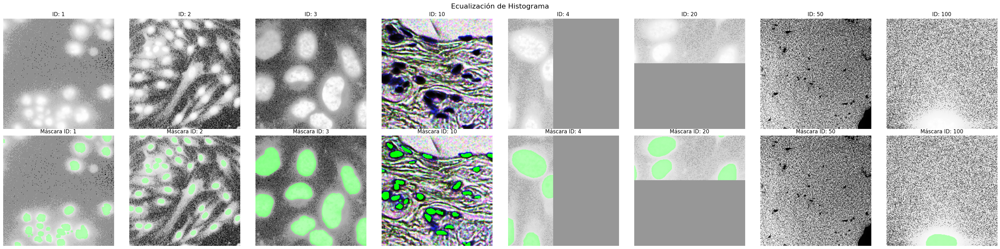

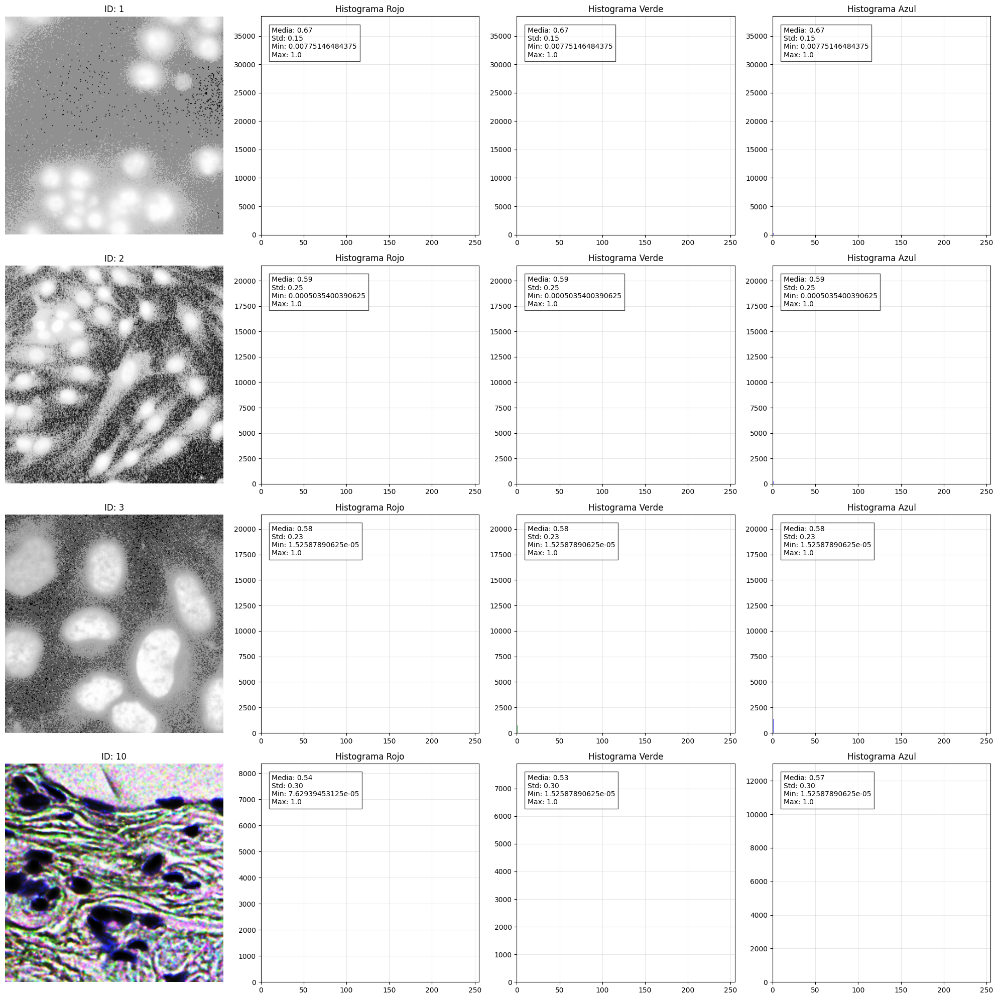

In [11]:
def normalize_histogram_equalization(image):
    """
    Aplica ecualización de histograma a cada canal de la imagen.
    
    Args:
        image: Imagen de entrada RGB
        
    Returns:
        Imagen con histograma ecualizado
    """
    # Verificar que la imagen es RGB
    if len(image.shape) < 3 or image.shape[2] != 3:
        # Para imágenes en escala de grises
        return exposure.equalize_hist(image)
    
    # Para imágenes RGB, equalizar cada canal por separado
    result = np.zeros_like(image, dtype=np.float32)
    
    for c in range(3):
        result[:,:,c] = exposure.equalize_hist(image[:,:,c])
    
    return result

def visualize_histogram_equalization(samples):
    """
    Aplica ecualización de histograma y visualiza los resultados.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
    """
    equalized_samples = []
    for sample_id, image, mask in samples:
        # Aplicar ecualización de histograma
        eq_image = normalize_histogram_equalization(image)
        equalized_samples.append((sample_id, eq_image, mask))
    
    # Visualizar resultados
    visualize_samples(equalized_samples, title="Ecualización de Histograma")
    
    # También mostramos histogramas de algunas muestras ecualizadas
    visualize_histograms(equalized_samples, n_samples=min(4, len(equalized_samples)))

# Ecualizar y visualizar
visualize_histogram_equalization(samples)